# Hamiltonian Neural Network - Kepler System

In [1]:
import numpy as np
import torch
import torch.nn as nn
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from Systems.Kepler import *
from Systems.Generate_Data import *
from HamiltonianNeuralNetwork.HNN import *
from HamiltonianNeuralNetwork.Train import *
from NumericalIntegration.Numerical_Integration import *

torch.random.manual_seed(1)
np.random.seed(33)

plt.rcParams['font.size'] = 12
plt.rcParams['lines.markersize'] = 10
plt.rcParams['legend.fontsize'] = 10
colors = sns.color_palette([(0.6,0.8,.8), (1,0.7,0.3), (0.2,0.7,0.2), (0.8,0,0.2), (0,0.4,1), (0.6,0.5,.9), (0.5,0.3,.5)])

In [2]:
  def initial_condition(self):
    def sampler():
        while True:
            H0 = np.random.uniform(-1.5, -0.01)
            e = np.random.uniform(0.1, 0.7)
            a = -1 / (2 * H0)

            L0 = np.sqrt((e**2 - 1) / (2 * H0))
            if L0 > 1.0:
                continue

            theta = np.random.uniform(0, 2*np.pi)
            r = a * (1 - e**2) / (1 + e * np.cos(theta))

            x0 = r * np.cos(theta)
            y0 = r * np.sin(theta)

            v = np.sqrt(2 * (1/r + H0))
            vx_dir = -np.sin(theta)
            vy_dir = np.cos(theta)

            px0 = v * vx_dir
            py0 = v * vy_dir

            # Optional: rotate whole orbit
            angle = np.random.uniform(0, 2*np.pi)
            R = np.array([
                [np.cos(angle), -np.sin(angle)],
                [np.sin(angle),  np.cos(angle)]
            ])
            x0, y0 = R @ np.array([x0, y0])
            px0, py0 = R @ np.array([px0, py0])

            # Check Hamiltonian consistency
            H = 0.5 * (px0**2 + py0**2) - 1 / np.sqrt(x0**2 + y0**2)
            if np.isclose(H, H0, atol=1e-5):
                return np.array([x0, y0, px0, py0])
        return sampler()

In [3]:
T_max_train = 2*np.pi
nsamples_train =  100*T_max_train/2
ntraj_train = 1750
T_max_val = T_max_train
nsamples_val = nsamples_train
ntraj_val = 750
epochs = 50

#Activations nn.Tanh(), nn.ReLU(), Sin(), nn.Softplus(), PAU(), PadeTypeActivation

act_1 = PAU()
act_2 = nn.Softplus()

lr = 1e-3
batch_size = 64
sys = KeplerSystem()

dt_train = T_max_train/nsamples_train
nt_train = round(T_max_train / dt_train)
t_train = np.linspace(0, T_max_train, nt_train + 1)

dt_val = T_max_val/nsamples_val
nt_val = round(T_max_val / dt_val)
t_val= np.linspace(0, T_max_val, nt_val + 1)

lam=1e-3 #Coeffcient for angular momentum conservation in loss

In [4]:
T_max_train = 5
nsamples_train = 100*5
ntraj_train = int(3000*0.75)
T_max_val = T_max_train
nsamples_val = nsamples_train
ntraj_val = int(3000*0.25)


sys = KeplerSystem()

dt_train = T_max_train/nsamples_train
nt_train = round(T_max_train / dt_train)
t_train = np.linspace(0, T_max_train, nt_train + 1)

dt_val = T_max_val/nsamples_val
nt_val = round(T_max_val / dt_val)
t_val= np.linspace(0, T_max_val, nt_val + 1)

act_1 = PAU()
act_2 = nn.Softplus()

epochs = 100
batch_size = 256
lr = 1e-3

lam=1e-3 

In [5]:
def Kepler_loss_func(dudt,dudt_est,u,sys,lam=lam):
    func = torch.nn.MSELoss()
    MSE_dudt = func(dudt_est,dudt)
    if lam == 0:
        return MSE_dudt
    else:
        if u.ndim ==1:
            x,y,px,py = u[0],u[1],u[2],u[3]
            x_dot,y_dot,px_dot,py_dot = dudt_est[0],dudt_est[1],dudt_est[2],dudt_est[3]
        else:
            x,y,px,py = u[:,0],u[:,1],u[:,2],u[:,3]
            x_dot,y_dot,px_dot,py_dot = dudt_est[:,0],dudt_est[:,1],dudt_est[:,2],dudt_est[:,3]
        dLdt_est = py*x_dot-px*y_dot-y*px_dot+x*py_dot
        dLdt = torch.stack([sys.L_dot(u_i) for u_i in u])
        MSE_dLdt = func(dLdt_est,dLdt)
        loss = MSE_dudt + lam*MSE_dLdt
        return loss

loss_func = loss_wrapper(Kepler_loss_func)


In [6]:
def get_Hamiltonians(model,u_exact,u_pred,t_sample,C):
    H_exact = torch.tensor([sys.Hamiltonian(u) for u in u_exact.squeeze(0)])

    t = t_sample.squeeze(0)
    u_samples = u_pred.squeeze(0)
    #Computed estimated Hamiltonian from values for prediction
    H_nn= torch.tensor([(model.Hamiltonian(u)- C )for u in u_samples])
    #Computed true Hamiltonian values for prediction
    H_exact_pred = torch.tensor([sys.Hamiltonian(u) for u in u_samples])
    #Computed NN Hamiltonian for exact
    H_nn_exact = torch.tensor([(model.Hamiltonian(torch.tensor(u, dtype = torch.float32)) - C) for u in u_exact.squeeze(0)])


    return H_exact, H_nn, H_exact_pred, H_nn_exact

## Explicit Midpoint

  0%|          | 0/100 [00:00<?, ?it/s]/Users/sannejamila/Documents/Vår 2025/Prosjektoppgave/Oppgave_github/HNNs_ODEs/Systems/Kepler.py:103: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:3729.)
  dH = self.Hamiltonian_grad(u.T).T
100%|██████████| 100/100 [9:59:12<00:00, 359.53s/it, epoch=99, loss=0.000818]   


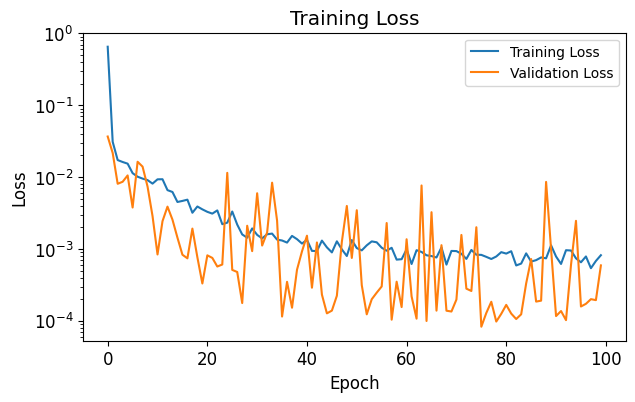

In [7]:
integrator = "midpoint"

(u_start, u_end, dt), dudt, u_train, u0s_train  =  generate_data(system=sys,ntrajectories =ntraj_train, t_sample = t_train,integrator=integrator)
train_data = (u_start, u_end, dt), dudt

(u_start, u_end, dt), dudt, u_val, u0s_val =  generate_data(system=sys,ntrajectories =ntraj_val, t_sample = t_val,integrator=integrator)
val_data = (u_start, u_end, dt), dudt

model_exp = HamiltonianNeuralNetwork(nstates = sys.nstates, S=sys.S, sys = sys, Hamiltonian_estimated = BaseHamiltonianNeuralNetwork(nstates=sys.nstates, act_1 = act_1, act_2 = act_2), initial_condition_sampler = initial_condition)

optimizer_exp = torch.optim.Adam(model_exp.parameters(), lr=lr)

trainer = Training(model = model_exp,integrator = integrator, train_data = train_data, val_data = val_data,optimizer = optimizer_exp, system = sys, batch_size=batch_size,epochs = epochs, L_coeff = lam)
model_exp, trainingdetails_explicit = trainer.train(loss_func)

### Predicting from Explicit Midpoint

In [8]:
tmax = 5*10
nsamples = 100*10
dt = tmax/nsamples

nt = round(tmax / dt)
t_sample = np.linspace(0, tmax, nt + 1)
integrator = "midpoint"
ntrajectories = 1

(u_start, u_end, dt), dudt, u_exact, u0s =  generate_data(system=sys,ntrajectories =ntrajectories, t_sample = t_sample,integrator=integrator)

u_phnn_exp, t_sample = model_exp.generate_trajectories(ntrajectories = ntrajectories, t_sample = t_sample,integrator = integrator,u0s=u0s)


100%|██████████| 1/1 [00:00<00:00, 94.80it/s]


/Users/sannejamila/Documents/Vår 2025/Prosjektoppgave/Oppgave_github/HNNs_ODEs/HamiltonianNeuralNetwork/HNN.py:109: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  u0 = torch.tensor(u0,dtype = torch.float32)


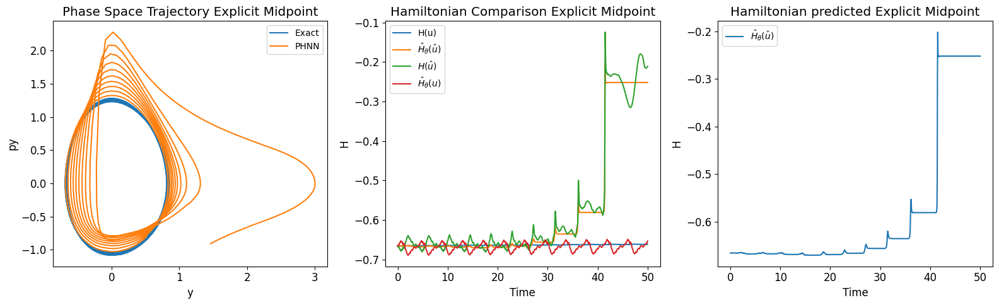

In [9]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))  
y, py = u_exact[0][:, 1], u_exact[0][:, 3]
ax[0].plot(y, py, label="Exact")
y, py = u_phnn_exp[0][:, 1], u_phnn_exp[0][:, 3]
ax[0].plot(y, py, label="PHNN")
ax[0].set_xlabel("y")
ax[0].set_ylabel("py")
ax[0].set_title("Phase Space Trajectory Explicit Midpoint" )
ax[0].legend()


C =model_exp.Hamiltonian(torch.tensor(u0s, dtype = torch.float32))- sys.Hamiltonian(u0s.squeeze(0))
H_exact, H_exp_nn, H_exact_pred, H_nn_exact = get_Hamiltonians(model_exp,u_exact,u_phnn_exp,t_sample,C)
t = t_sample.squeeze(0)

ax[1].plot(t, H_exact, label="H(u)")
ax[1].plot(t, H_exp_nn, label=r"$\hat{H}_{\theta}(\hat u)$")
ax[1].plot(t, H_exact_pred, label=r"$H(\hat u)$")
ax[1].plot(t, H_nn_exact, label=r"$\hat{H}_{\theta}(u)$")
ax[1].set_xlabel("Time")
ax[1].set_ylabel("H")
ax[1].set_title("Hamiltonian Comparison Explicit Midpoint")
ax[1].legend()

ax[2].plot(t, H_exp_nn, label=r"$\hat{H}_{\theta}(\hat u)$")
ax[2].set_xlabel("Time")
ax[2].set_ylabel("H")
ax[2].set_title("Hamiltonian predicted Explicit Midpoint")
ax[2].legend()

plt.tight_layout() 
plt.show()




## Symplectic Euler

100%|██████████| 100/100 [28:55:41<00:00, 1041.42s/it, epoch=99, loss=0.000905]  


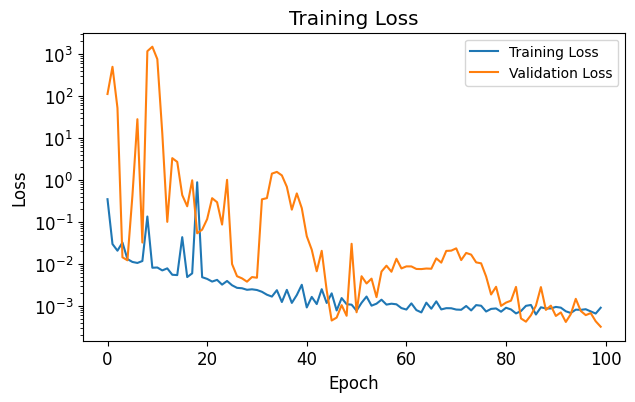

In [10]:
integrator = "symplectic euler"

(u_start, u_end, dt), dudt, u_train, u0s_train  =  generate_data(system=sys,ntrajectories =ntraj_train, t_sample = t_train,integrator=integrator)
train_data = (u_start, u_end, dt), dudt

(u_start, u_end, dt), dudt, u_val, u0s_val =  generate_data(system=sys,ntrajectories =ntraj_val, t_sample = t_val,integrator=integrator)
val_data = (u_start, u_end, dt), dudt

model_symp_eul = HamiltonianNeuralNetwork(nstates = sys.nstates, S=sys.S, sys = sys, Hamiltonian_estimated = BaseHamiltonianNeuralNetwork(nstates=sys.nstates, act_1 = act_1, act_2 = act_2), initial_condition_sampler = initial_condition)

optimizer_symp_eul= torch.optim.Adam(model_symp_eul.parameters(), lr=lr)

trainer = Training(model = model_symp_eul,integrator = integrator, train_data = train_data, val_data = val_data,optimizer = optimizer_symp_eul, system = sys, batch_size=batch_size,epochs = epochs, L_coeff = lam)
model_symp_eul, trainingdetails_symp_eul = trainer.train(loss_func)

### Predicting from Symplectic Euler

In [11]:
tmax = 5*10
nsamples = 100*10
dt = tmax/nsamples

nt = round(tmax / dt)
t_sample = np.linspace(0, tmax, nt + 1)
integrator = "symplectic euler"
ntrajectories = 1

(u_start, u_end, dt), dudt, u_exact, u0s =  generate_data(system=sys,ntrajectories =ntrajectories, t_sample = t_sample,integrator=integrator)

u_phnn_symp_eul, t_sample = model_symp_eul.generate_trajectories(ntrajectories = ntrajectories, t_sample = t_sample,integrator = integrator,u0s=u0s)


100%|██████████| 1/1 [00:00<00:00, 65.72it/s]


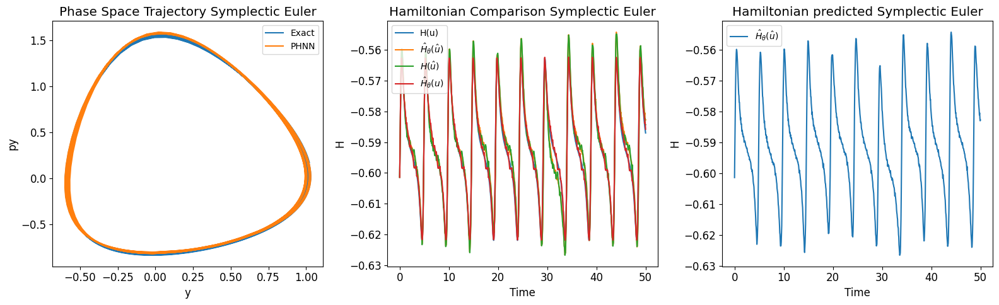

In [12]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))  
y, py = u_exact[0][:, 1], u_exact[0][:, 3]
ax[0].plot(y, py, label="Exact")
y, py = u_phnn_symp_eul[0][:, 1], u_phnn_symp_eul[0][:, 3]
ax[0].plot(y, py, label="PHNN")
ax[0].set_xlabel("y")
ax[0].set_ylabel("py")
ax[0].set_title("Phase Space Trajectory Symplectic Euler" )
ax[0].legend()


C =model_symp_eul.Hamiltonian(torch.tensor(u0s, dtype = torch.float32))- sys.Hamiltonian(u0s.squeeze(0))
H_exact, H_symp_eul_nn, H_exact_pred, H_nn_exact = get_Hamiltonians(model_symp_eul,u_exact,u_phnn_symp_eul,t_sample,C)
t = t_sample.squeeze(0)

ax[1].plot(t, H_exact, label="H(u)")
ax[1].plot(t, H_symp_eul_nn, label=r"$\hat{H}_{\theta}(\hat u)$")
ax[1].plot(t, H_exact_pred, label=r"$H(\hat u)$")
ax[1].plot(t, H_nn_exact, label=r"$\hat{H}_{\theta}(u)$")
ax[1].set_xlabel("Time")
ax[1].set_ylabel("H")
ax[1].set_title("Hamiltonian Comparison Symplectic Euler")
ax[1].legend()

ax[2].plot(t, H_symp_eul_nn, label=r"$\hat{H}_{\theta}(\hat u)$")
ax[2].set_xlabel("Time")
ax[2].set_ylabel("H")
ax[2].set_title("Hamiltonian predicted Symplectic Euler")
ax[2].legend()

plt.tight_layout() 
plt.show()




## Sympelctic Midpoint

  0%|          | 0/100 [00:00<?, ?it/s]/Users/sannejamila/Documents/Vår 2025/Prosjektoppgave/Oppgave_github/HNNs_ODEs/Systems/Kepler.py:103: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:3729.)
  dH = self.Hamiltonian_grad(u.T).T
100%|██████████| 100/100 [4:00:32<00:00, 144.33s/it, epoch=99, loss=0.000592] 


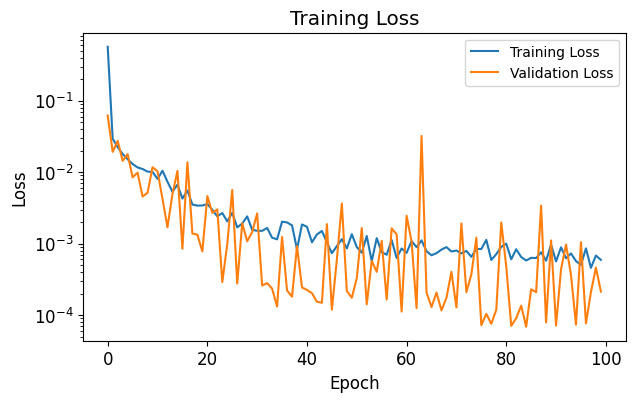

In [ ]:
integrator = "symplectic midpoint"

(u_start, u_end, dt), dudt, u_train, u0s_train  =  generate_data(system=sys,ntrajectories =ntraj_train, t_sample = t_train,integrator=integrator)
train_data = (u_start, u_end, dt), dudt

(u_start, u_end, dt), dudt, u_val, u0s_val =  generate_data(system=sys,ntrajectories =ntraj_val, t_sample = t_val,integrator=integrator)
val_data = (u_start, u_end, dt), dudt

model_symp = HamiltonianNeuralNetwork(nstates = sys.nstates, S=sys.S, sys = sys, Hamiltonian_estimated = BaseHamiltonianNeuralNetwork(nstates=sys.nstates, act_1 = act_1, act_2 = act_2), initial_condition_sampler = initial_condition)

optimizer_symp= torch.optim.Adam(model_symp.parameters(), lr=lr)

trainer = Training(model = model_symp,integrator = integrator, train_data = train_data, val_data = val_data,optimizer = optimizer_symp, system = sys, batch_size=batch_size,epochs = epochs, L_coeff = lam)
model_symp, trainingdetails_symp = trainer.train(loss_func)

### Predicting from Symplectic Midpoint

In [ ]:
tmax = 5*10
nsamples = 100*10
dt = tmax/nsamples

nt = round(tmax / dt)
t_sample = np.linspace(0, tmax, nt + 1)
integrator = "symplectic midpoint"
ntrajectories = 1

(u_start, u_end, dt), dudt, u_exact, u0s =  generate_data(system=sys,ntrajectories =ntrajectories, t_sample = t_sample,integrator=integrator)

u_phnn_symp, t_sample = model_symp.generate_trajectories(ntrajectories = ntrajectories, t_sample = t_sample,integrator = integrator,u0s=u0s)


100%|██████████| 1/1 [00:00<00:00,  7.25it/s]
/Users/sannejamila/Documents/Vår 2025/Prosjektoppgave/Oppgave_github/HNNs_ODEs/HamiltonianNeuralNetwork/HNN.py:109: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  u0 = torch.tensor(u0,dtype = torch.float32)
/Users/sannejamila/Documents/Vår 2025/Prosjektoppgave/Oppgave_github/HNNs_ODEs/NumericalIntegration/Numerical_Integration.py:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  guess = torch.tensor(guess, dtype=torch.float32, requires_grad=True)


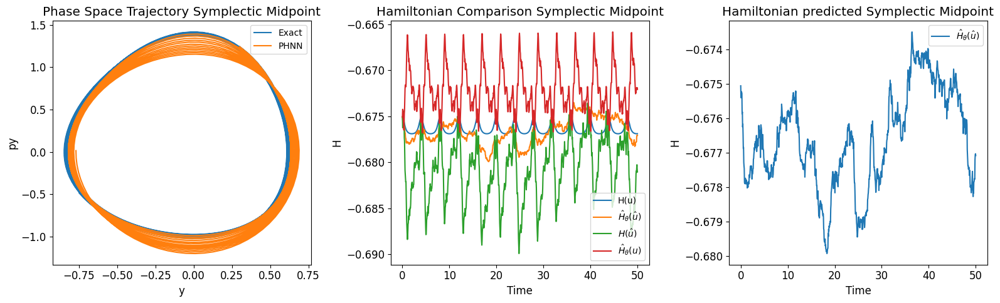

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))  
y, py = u_exact[0][:, 1], u_exact[0][:, 3]
ax[0].plot(y, py, label="Exact")
y, py = u_phnn_symp[0][:, 1], u_phnn_symp[0][:, 3]
ax[0].plot(y, py, label="PHNN")
ax[0].set_xlabel("y")
ax[0].set_ylabel("py")
ax[0].set_title("Phase Space Trajectory Symplectic Midpoint" )
ax[0].legend()


C =model_symp.Hamiltonian(torch.tensor(u0s, dtype = torch.float32))- sys.Hamiltonian(u0s.squeeze(0))
H_exact, H_symp_nn, H_exact_pred, H_nn_exact = get_Hamiltonians(model_symp,u_exact,u_phnn_symp,t_sample,C)
t = t_sample.squeeze(0)

ax[1].plot(t, H_exact, label="H(u)")
ax[1].plot(t, H_symp_nn, label=r"$\hat{H}_{\theta}(\hat u)$")
ax[1].plot(t, H_exact_pred, label=r"$H(\hat u)$")
ax[1].plot(t, H_nn_exact, label=r"$\hat{H}_{\theta}(u)$")
ax[1].set_xlabel("Time")
ax[1].set_ylabel("H")
ax[1].set_title("Hamiltonian Comparison Symplectic Midpoint")
ax[1].legend()

ax[2].plot(t, H_symp_nn, label=r"$\hat{H}_{\theta}(\hat u)$")
ax[2].set_xlabel("Time")
ax[2].set_ylabel("H")
ax[2].set_title("Hamiltonian predicted Symplectic Midpoint")
ax[2].legend()

plt.tight_layout() 
plt.show()




## Animating Prediction

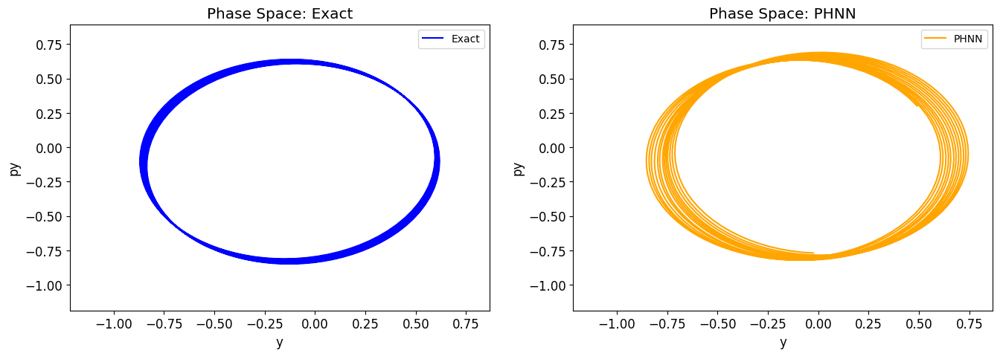

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(16, 5))


for a in ax:
    a.set_xlabel("y")
    a.set_ylabel("py")
    a.set_xlim([-2, 2])
    a.set_ylim([-1, 1])

ax[0].set_title("Phase Space: Exact")
ax[1].set_title("Phase Space: PHNN")

y_exact = u_exact[0][:, 0]
py_exact = u_exact[0][:, 1]
y_phnn = u_phnn_symp[0][:, 0]
py_phnn = u_phnn_symp[0][:, 1]

#If tensors, convert to numpy
if hasattr(y_exact, 'detach'):
    y_exact = y_exact.detach().cpu().numpy()
    py_exact = py_exact.detach().cpu().numpy()
    y_phnn = y_phnn.detach().cpu().numpy()
    py_phnn = py_phnn.detach().cpu().numpy()


frame_skip = 10
frame_indices = np.arange(0, len(y_exact), frame_skip)


line_exact, = ax[0].plot([], [], label="Exact", color='blue')
line_phnn, = ax[1].plot([], [], label="PHNN", color='orange')
ax[0].legend()
ax[1].legend()
ax[0].set_xlim([min(y_exact)*1.4, max(y_exact)*1.4])
ax[0].set_ylim([min(py_exact)*1.4, max(py_exact)*1.4])
ax[1].set_xlim([min(y_exact)*1.4, max(y_exact)*1.4])
ax[1].set_ylim([min(py_exact)*1.4, max(py_exact)*1.4])


def update(i):
    frame = frame_indices[i]
    line_exact.set_data(y_exact[:frame], py_exact[:frame])
    line_phnn.set_data(y_phnn[:frame], py_phnn[:frame])
    return line_exact, line_phnn

ani = animation.FuncAnimation(
    fig,
    update,
    frames=len(frame_indices),
    interval=30,  
    blit=True
)

HTML(ani.to_jshtml())
